# ARBOLES DE DECISIÓN

In [1]:
#!pip install imbalanced-learn --user
#!pip install -U scikit-learn

In [2]:
# Importamos Bibliotecas

In [108]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

In [5]:
df = pd.read_csv('C:\\Users\\ALLAN\\Desktop\\Business Analytics con Python y ChatGPT\\EON_preprocesado.csv')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9240 entries, 0 to 9239
Data columns (total 32 columns):
 #   Column                                         Non-Null Count  Dtype  
---  ------                                         --------------  -----  
 0   Lead Number                                    9240 non-null   int64  
 1   Lead Origin                                    9240 non-null   object 
 2   Lead Source                                    9240 non-null   object 
 3   Do Not Email                                   9240 non-null   bool   
 4   Do Not Call                                    9240 non-null   bool   
 5   Converted                                      9240 non-null   bool   
 6   TotalVisits                                    9240 non-null   float64
 7   Total Time Spent on Website                    9240 non-null   int64  
 8   Page Views Per Visit                           9240 non-null   float64
 9   Last Activity                                  9240 

In [7]:
# Codificación para variables categóricas (las transformamos a dummies)

In [8]:
df = pd.get_dummies(df, drop_first = True)

In [9]:
df.head()

,Lead Number,Do Not Email,Do Not Call,Converted,TotalVisits,Total Time Spent on Website,Page Views Per Visit,Search,Magazine,Newspaper Article,...,Last Notable Activity_Form Submitted on Website,Last Notable Activity_Had a Phone Conversation,Last Notable Activity_Modified,Last Notable Activity_Olark Chat Conversation,Last Notable Activity_Page Visited on Website,Last Notable Activity_Resubscribed to emails,Last Notable Activity_SMS Sent,Last Notable Activity_Unreachable,Last Notable Activity_Unsubscribed,Last Notable Activity_View in browser link Clicked
0,660737,False,False,False,0.0,0,0.0,False,False,False,...,False,False,True,False,False,False,False,False,False,False
1,660728,False,False,False,5.0,674,2.5,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,660727,False,False,True,2.0,1532,2.0,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,660719,False,False,False,1.0,305,1.0,False,False,False,...,False,False,True,False,False,False,False,False,False,False
4,660681,False,False,True,2.0,1428,1.0,False,False,False,...,False,False,True,False,False,False,False,False,False,False


In [10]:
# División entre características (independientes) y variable objetivo (dependiente)

In [11]:
X = df.drop('Converted', axis=1)

In [12]:
Y = df['Converted']

In [13]:
# Equilibrar las clases 

In [14]:
# Contar la cantidad de registros en cada clase

In [18]:
conteo_clases = df['Converted'].value_counts()

In [19]:
conteo_clases

Converted
False    5679
True     3561
Name: count, dtype: int64

In [20]:
porcentaje_clases =(conteo_clase/len(df['Converted']))*100

In [21]:
porcentaje_clases

Converted
False    61.461039
True     38.538961
Name: count, dtype: float64

Aunque el desequilibrio no es extremo, hay una diferencia significativa entre las clases: aproximadamente 61% de los registros pertenecen a la clase False y 39% a la clase True.

En el contexto de modelos predictivos como los árboles de decisión, este nivel de desequilibrio puede llevar a un sesgo en las predicciones hacia la clase mayoritaria. Equilibrar las clases puede ayudar a mejorar la precisión y la generalización del modelo, asegurándose de que no se sobreestime la importancia de la clase más común.

Para equilibrar las clases, puedes utilizar técnicas como el sobremuestreo (oversampling) de la clase minoritaria o el submuestreo (undersampling) de la clase mayoritaria. Una herramienta común para el sobremuestreo es SMOTE (Synthetic Minority Over-sampling Technique), que genera registros sintéticos para la clase minoritaria basándose en los existentes, en lugar de simplemente replicar los registros existentes.

In [22]:
# Aplicar SMOTE para equilibrar las clases

In [23]:
# Creamos un objeto de la clase SMOTE()

In [24]:
smote = SMOTE()

In [25]:
# Equilibramos las características (independiente) y el objetivo (dependiente)

In [26]:
X_equilibrado, Y_equilibrado = smote.fit_resample(X,Y)

In [27]:
# Comprobamos que están equilibradas

In [28]:
conteo_clases = Y_equilibrado.value_counts()

In [29]:
conteo_clases

Converted
False    5679
True     5679
Name: count, dtype: int64

In [30]:
# Dividir los datos en conjuntos de entrenamiento y prueba

In [32]:
X_entrenamiento, X_evaluacion, Y_entrenamiento, X_evalucion = train_test_split(X_equilibrado, Y_equilibrado, test_size=0.2, random_state=99)

In [33]:
# Opcional: Hacer el escalado de datos (estandarizar entre 0 y 1)

Es cierto que, en el caso de los modelos de árboles de decisión, como los árboles de clasificación o regresión (e incluso Random Forests y Gradient Boosting), no es estrictamente necesario estandarizar o normalizar los datos, a diferencia de otros algoritmos como las máquinas de soporte vectorial (SVM) o los métodos basados en distancias, donde el escalado es crucial.

Los árboles de decisión realizan divisiones basándose en las características una a una y son invariantes a la escala de las variables. Esto significa que si una característica se escala o transforma, no afecta la forma en que el árbol de decisión divide los datos basándose en esa característica.

Sin embargo, hay situaciones en las que la normalización o estandarización de las características puede ser beneficiosa incluso para los árboles de decisión:

Mejora de la Eficiencia Computacional: Cuando las características están en la misma escala, puede mejorar la eficiencia de los cálculos realizados por el algoritmo, especialmente en grandes conjuntos de datos.

Consistencia en el Preprocesamiento: Si estás comparando o combinando árboles de decisión con otros modelos que requieren datos estandarizados, mantener un enfoque consistente de preprocesamiento de datos puede ser útil.

Por lo tanto, aunque no es un requisito, la normalización de los datos en los modelos de árboles puede ofrecer ciertas ventajas prácticas, y podría ser una buena práctica dependiendo del contexto específico de tu análisis y de tus datos.

In [34]:
# Inicializar MinMaxScaler

In [35]:
scaler = MinMaxScaler()

In [36]:
# Ajustar el escalador a los datos de entrenamiento y transformarlos

In [37]:
X_entrenamiento = scaler.fit_transform(X_entrenamiento)

In [38]:
# Transformar los datos de evaluación

In [39]:
X_evalucion = scaler.transform(X_evaluacion)

# CREANDO Y VISUALIZANDO EL ÁRBOL DE CLASIFICACIÓN

In [40]:
# Crear el objeto del modelo de árbol de decisión con un estado aleatorio fijo para reproducibilidad

In [41]:
arbol_clasificacion = DecisionTreeClassifier(random_state=99)

In [42]:
# Entrenar el modelo con los conjuntos de entrenamiento

In [43]:
arbol_clasificacion.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(random_state=99)

In [44]:
# Generar la visualización del árbol
# X_entrenamiento es un array, pero podríamos obtener los nombres de las variables de X que es un df 

In [46]:
plt.figure(figsize=(20,100), dpi=300)
plot_tree(arbol_clasificacion,
         feature_names = X.columns.tolist(),
         class_names = ['No Compró', 'Compró'],
         filled=True, impurity=False, rounded=True, fontsize=10)
plt.show()

In [47]:
# Simplificar el árbol estableciendo un 'max_depth' razonable.

In [48]:
arbol_simplificado = DecisionTreeClassifier(max_depth=3, random_state=99)

In [49]:
arbol_simplificado.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(max_depth=3, random_state=99)

In [50]:
# Visualizar el árbol simplificado

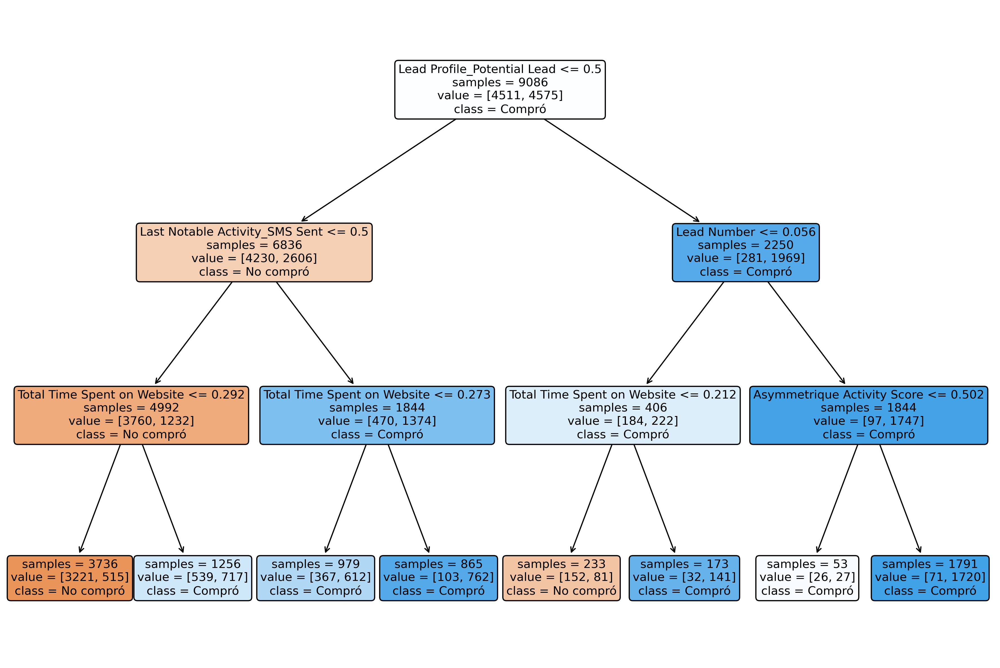

In [51]:
plt.figure(figsize=(15,10), dpi = 300)
plot_tree(arbol_simplificado,
         feature_names = X.columns.tolist(),
         class_names = ['No compró', 'Compró'],
         filled = True, impurity = False, rounded = True, fontsize = 10)
plt.show()

# PRIMER RESULTADO

## Contexto del Árbol

El árbol clasifica si un cliente potencial realiza una compra (clase "Compró") o no (clase "No Compró") en función de diferentes variables, como:

* Lead Profile (Potential Lead): Indica el perfil del cliente potencial.
* Last Notable Activity (SMS Sent): Representa si hubo actividad reciente como un mensaje enviado.
* Total Time Spent on Website: Tiempo total que el usuario pasó en el sitio web.
* Lead Number y Asymmetric Activity Score: Otras métricas relacionadas con la interacción del cliente.

## 📌 Conclusiones

**1. Lead Profile es el factor principal:**

* Si el valor de Lead Profile es menor o igual a 0.5, el cliente es más propenso a no comprar (Clase "No Compró").
* Si es mayor, el cliente tiene más probabilidades de comprar (Clase "Compró").

**2. Última actividad notable (SMS enviado):**

* Si el cliente no tuvo actividad reciente (SMS Sent <= 0.5), la probabilidad de no comprar aumenta.
* Sin embargo, si el cliente pasa más tiempo en el sitio web (e.g., Total Time Spent on Website > 0.292), las probabilidades de comprar mejoran.

**3. Tiempo en el sitio web:**

* Un mayor tiempo en el sitio web está positivamente correlacionado con la probabilidad de compra.
Por ejemplo:
Clientes con Total Time Spent on Website > 0.273 muestran una mayor probabilidad de compra.

**4. Asymmetric Activity Score y Lead Number:**

* Valores altos en Asymmetric Activity Score > 0.502 indican una mayor probabilidad de compra (e.g., 1720 compras frente a solo 71 "No Compró").
* Esto podría indicar que actividades asimétricas o atípicas son un indicador importante de interés en la compra.


## 📌 Recomendaciones Basadas en el Árbol

**1. Optimizar el tiempo en el sitio web:**
* Diseña estrategias para aumentar el tiempo que los clientes potenciales pasan en la plataforma. Esto podría incluir contenido interactivo,              recomendaciones personalizadas o mejoras en la experiencia de usuario.

**2. Enfocar esfuerzos en clientes con actividad reciente:**

* Los usuarios con valores altos en Asymmetric Activity Score y Lead Number son los más propensos a comprar.
* Implementa campañas específicas para este segmento.

**3. Revisión de perfiles:**

* Los clientes con Lead Profile <= 0.5 son menos propensos a comprar. Podría ser útil identificar qué define este perfil y ajustar estrategias para       mejorar sus probabilidades de conversión. marketing y ventas.

# PODA DE ÁRBOL

In [52]:
# Creamos varios árboles, generemos una función que tome como parámetro el nombre del árbol y lo grafique

In [54]:
def graficar_arbol_de_decision(arbol):
    plt.figure(figsize=(20,20), dpi = 300)
    plot_tree(arbol,
              feature_names = X.columns.tolist(),
              class_names = ['No compró', 'Compró'],
              filled = True, impurity = False, rounded = True, fontsize = 10)
    plt.show()  

# Poda con min_samples_leaf
Otra estrategia efectiva es definir el número mínimo de muestras que debe tener un nodo para ser considerado una hoja a través de min_samples_leaf. Esta restricción asegura que cada decisión tomada por el árbol esté respaldada por un número suficiente de datos, aumentando la confianza en las predicciones.

In [55]:
# Creamos la instancia DecisionTreeClassifier

In [56]:
arbol_poda_min_samples_leaf_100 = DecisionTreeClassifier(min_samples_leaf=100, random_state=99)

In [57]:
# Hacemos el fit del modelo con los datos de entrenamiento

In [58]:
arbol_poda_min_samples_leaf_100.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(min_samples_leaf=100, random_state=99)

In [59]:
# Graficamos

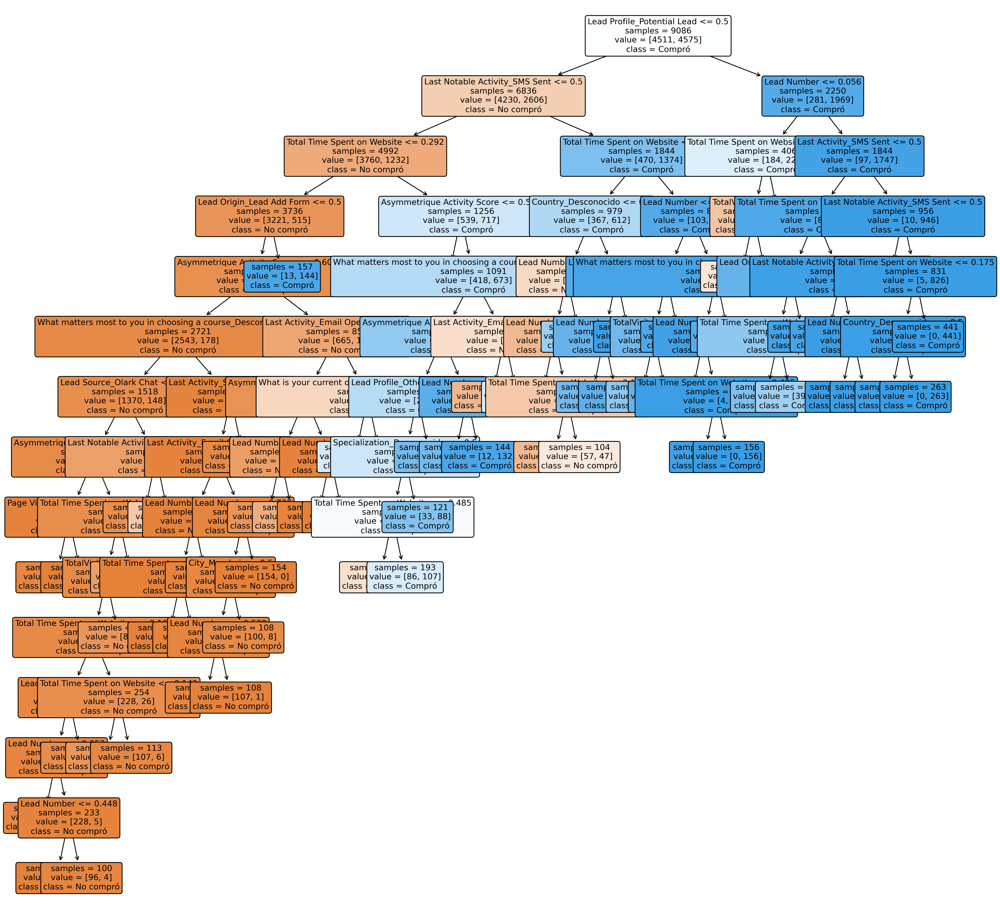

In [61]:
graficar_arbol_de_decision(arbol_poda_min_samples_leaf_100)

In [62]:
# Se obtuvo un árbol bastante complejo. Por lo cual lo podaremos más restringiendo el número de hojas a 200

In [63]:
arbol_poda_min_samples_leaf_200 = DecisionTreeClassifier(min_samples_leaf = 200, random_state = 99)

In [64]:
arbol_poda_min_samples_leaf_200.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(min_samples_leaf=200, random_state=99)

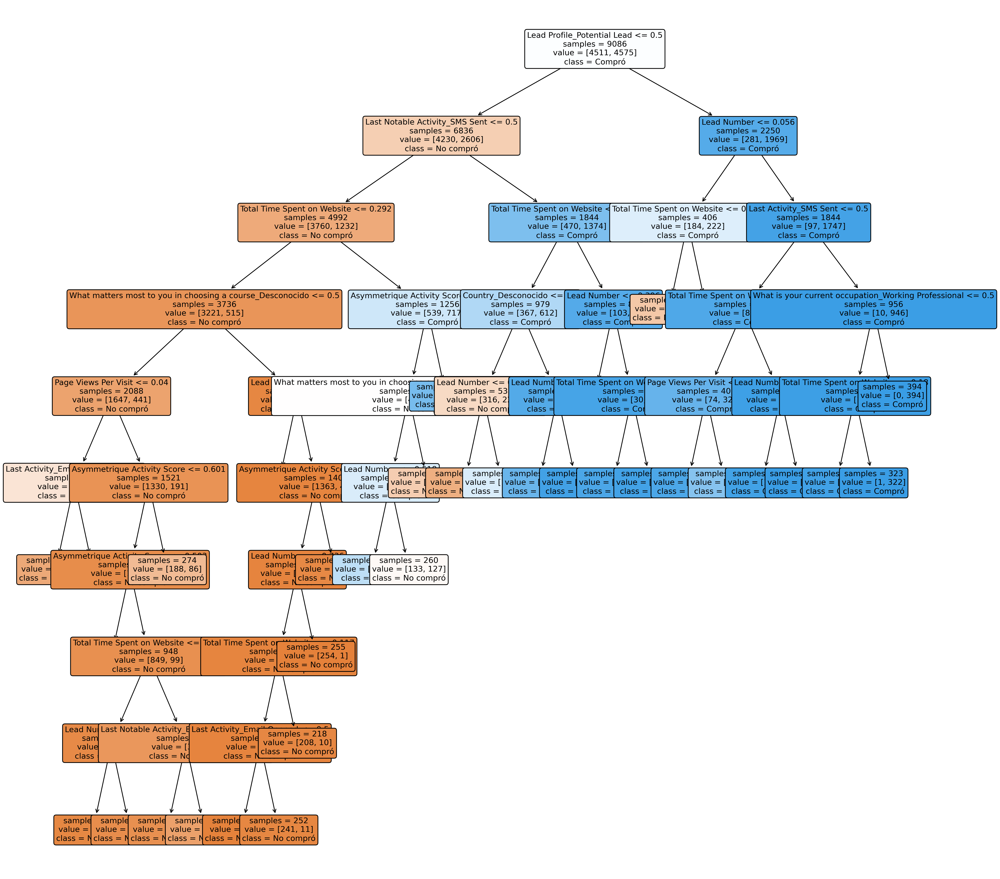

In [65]:
graficar_arbol_de_decision(arbol_poda_min_samples_leaf_200)

# Poda con ccp_alpha
Este enfoque busca el equilibrio entre la complejidad del árbol y su rendimiento en el conjunto de entrenamiento, penalizando los árboles más complejos para favorecer estructuras más simples y robustas.

El parámetro ccp_alpha en los árboles de decisión se refiere al parámetro de complejidad de costo utilizado para la poda basada en costos. La intuición detrás de este parámetro es que quiere penalizar los modelos más complejos para prevenir el sobreajuste. La "complejidad" aquí puede entenderse como la profundidad o el número total de divisiones del árbol.

Un valor de ccp_alpha más alto significa que el modelo estará más penalizado por la complejidad. En términos prácticos, un ccp_alpha de 0.005 aplicará una penalización más ligera que un ccp_alpha de 0.010. Esto se traduce en que el árbol resultante con un ccp_alpha de 0.005 podría ser más complejo (con más nodos y divisiones) que uno con un ccp_alpha de 0.010, que será más simple debido a la mayor penalización.

En resumen, un ccp_alpha de 0.005 permitirá que el árbol crezca más antes de ser podado, mientras que con un ccp_alpha de 0.010, se podará más agresivamente, eliminando antes las ramas que no aportan una mejora significativa en la reducción del error de clasificación ponderado por la penalización de complejidad. El objetivo es encontrar el valor de ccp_alpha que equilibre de manera óptima la precisión del modelo y su simplicidad para obtener las predicciones más confiables en datos no vistos.

In [66]:
arbol_poda_ccp_alpha_005 = DecisionTreeClassifier(ccp_alpha=0.005, random_state = 99)

In [67]:
arbol_poda_ccp_alpha_005.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(ccp_alpha=0.005, random_state=99)

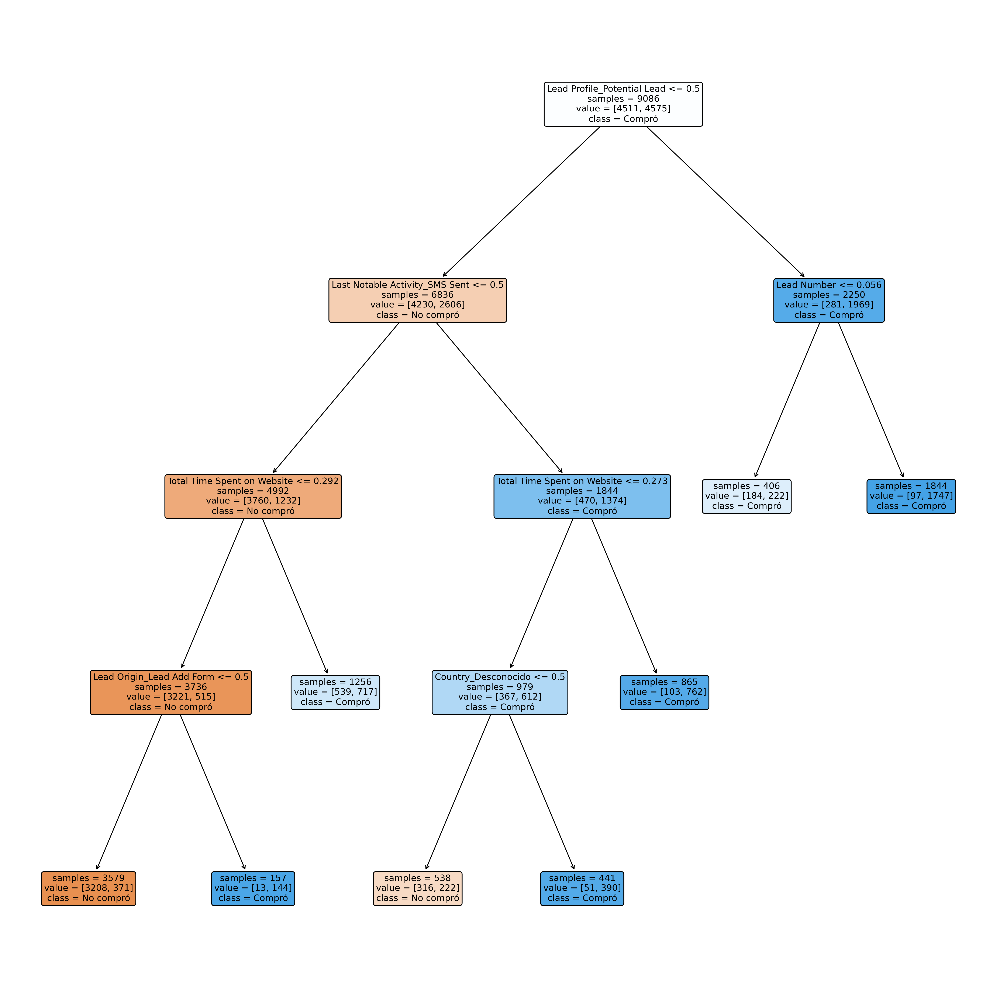

In [68]:
graficar_arbol_de_decision(arbol_poda_ccp_alpha_005)

In [69]:
# Ahora un modelo con ccp_alpha de 0.010

In [70]:
arbol_poda_ccp_alpha_010 = DecisionTreeClassifier(ccp_alpha=0.010, random_state = 99)

In [71]:
arbol_poda_ccp_alpha_010.fit(X_entrenamiento, Y_entrenamiento)

DecisionTreeClassifier(ccp_alpha=0.01, random_state=99)

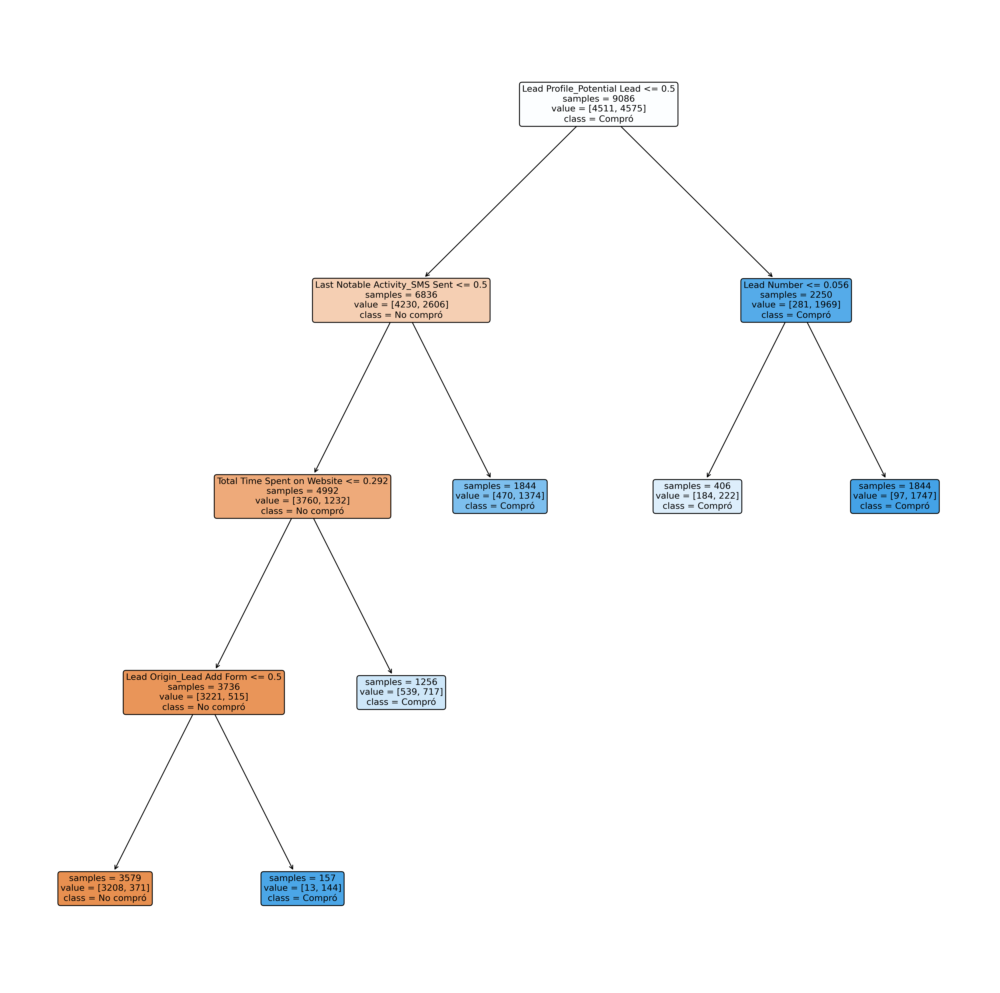

In [72]:
graficar_arbol_de_decision(arbol_poda_ccp_alpha_010)

# AUC

Definamos una función que calcule el área bajo la curva (AUC) para un modelo dado.
       
El modelo asume que existe:
        
X_evaluacion: conjunto de características de evaluación.
        
Y_evaluacion: conjunto de etiquetas de evaluación.

In [84]:
def estimar_auc(modelo):
    Y_prediccion = modelo.predict_proba(X_evaluacion)[:,1]
    fpr, tpr, puntos_de_corte = roc_curve(Y_evaluacion, Y_prediccion)
    auc_valor = auc(fpr, tpr)
    return auc_valor

In [ ]:
# Una vez con la función, estimemos los AUC para los diferentes modelos de árboles de clasificación que hemos generado
# Recordemos el AUC de la regresión logística fue de 0.92
# arbol_clasificacion
# arbol_simplificado: este sólo tenía 3 niveles de profundidad
# arbol_poda_min_samples_leaf_100
# arbol_poda_min_samples_leaf_200
# arbol_poda_ccp_alpha_005
# arbol_poda_ccp_alpha_010

In [ ]:
estimar_auc(arbol_clasificacion)

0.8401031585020846

In [ ]:
estimar_auc(arbol_simplificado)

0.8351778867629542

In [ ]:
estimar_auc(arbol_poda_min_samples_leaf_100)

0.911038394009331

In [ ]:
estimar_auc(arbol_poda_min_samples_leaf_200)

0.900177747170935

In [ ]:
estimar_auc(arbol_poda_ccp_alpha_005)

0.8734920184385546

In [ ]:
estimar_auc(arbol_poda_ccp_alpha_010)

0.8562966082241413

# Hiperparámetros y Cuadrículas de Búsqueda

In [86]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier

# Definir el modelo base de árbol de decisión
modelo_arbol = DecisionTreeClassifier(random_state=99)

# Establecer los parámetros para la búsqueda en cuadrícula
parametros_grid = {
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 20, 25],
    'min_samples_leaf': [10, 50, 100, 200, 500],
    'ccp_alpha': [0.0, 0.001, 0.002, 0.005, 0.010, 0.1]
}

# Crear el objeto GridSearchCV
grid_search = GridSearchCV(modelo_arbol, parametros_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ejecutar la búsqueda en cuadrícula con los datos de entrenamiento
grid_search.fit(X_entrenamiento, Y_entrenamiento)

# Mejores parámetros encontrados
mejores_parametros = grid_search.best_params_

# Mejor modelo encontrado
mejor_modelo = grid_search.best_estimator_

# Código para imprimir los resultados
print("Mejores parámetros encontrados:", mejores_parametros)
print("Mejor modelo:", mejor_modelo)

# Nota: Asegúrate de tener definidos 'X_entrenamiento' y 'Y_entrenamiento' en tu entorno de Jupyter antes de ejecutar este código.
# Este código realiza una búsqueda en cuadrícula en un árbol de decisión, utilizando validación cruzada para evaluar el rendimiento de cada combinación de parámetros.


Mejores parámetros encontrados: {'ccp_alpha': 0.0, 'max_depth': 9, 'min_samples_leaf': 10}
Mejor modelo: DecisionTreeClassifier(max_depth=9, min_samples_leaf=10, random_state=99)


In [ ]:
from sklearn.metrics import roc_auc_score

# Asignar los mejores parámetros al modelo
modelo_optimizado = DecisionTreeClassifier(max_depth=10, min_samples_leaf=10, ccp_alpha=0.0, random_state=99)

# Entrenar el modelo con los datos de entrenamiento
modelo_optimizado.fit(X_entrenamiento, Y_entrenamiento)

# Realizar predicciones sobre el conjunto de evaluación
Y_prediccion = modelo_optimizado.predict_proba(X_evaluacion)[:, 1]

# Calcular el AUC utilizando los datos de evaluación
auc_optimizado = roc_auc_score(Y_evaluacion, Y_prediccion)

print("AUC del modelo optimizado:", auc_optimizado)

AUC del modelo optimizado: 0.9271182313380981


# Optimización del Modelo con Búsqueda en Cuadrícula con Hiperparámetros

In [ ]:
# from sklearn.tree import DecisionTreeClassifier
# from sklearn.model_selection import GridSearchCV
# from sklearn.metrics import roc_auc_score

# Suponiendo que X_entrenamiento, Y_entrenamiento, X_evaluacion, y Y_evaluacion ya están definidos

# Configuración del Modelo de Árbol de Decisión
decision_tree = DecisionTreeClassifier(random_state=99)

# Definición de hiperparámetros para la búsqueda en cuadrícula
parametros = {
    'max_depth': [3, 4, 5, 6, 7, 8, 9, 10, 12, 15, 20, 25],
    'min_samples_leaf': [10, 50, 100, 200, 500],
    'ccp_alpha': [0.0, 0.001, 0.002, 0.005, 0.010, 0.1]
}

# Búsqueda en cuadrícula con validación cruzada
busqueda_cuadricula = GridSearchCV(decision_tree, parametros, cv=5, scoring='roc_auc')
busqueda_cuadricula.fit(X_entrenamiento, Y_entrenamiento)

# Mejores parámetros y modelo
mejores_parametros = busqueda_cuadricula.best_params_
mejor_modelo = busqueda_cuadricula.best_estimator_

# Entrenar y evaluar el mejor modelo
mejor_modelo.fit(X_entrenamiento, Y_entrenamiento)
predicciones = mejor_modelo.predict_proba(X_evaluacion)[:, 1]
auc = roc_auc_score(Y_evaluacion, predicciones)

mejores_parametros, auc

({'ccp_alpha': 0.0, 'max_depth': 10, 'min_samples_leaf': 10},
 0.9271182313380981)

# Random Forest

In [89]:
# Crear el modelo de Random Forest

In [91]:
# Crear el modelo de Random Forest

In [94]:
modelo_rf = RandomForestClassifier( n_estimators=1000, random_state=99)

In [95]:
# Entrenar el modelo con los datos de entrenamiento

In [96]:
modelo_rf.fit(X_entrenamiento, Y_entrenamiento)

RandomForestClassifier(n_estimators=1000, random_state=99)

In [97]:
# Hacer predicciones en el conjunto de evaluación

In [98]:
predicciones_rf = modelo_rf.predict(X_evaluacion)

C:\Users\ALLAN\anaconda3\Lib\site-packages\sklearn\base.py:432: UserWarning: X has feature names, but RandomForestClassifier was fitted without feature names
  warnings.warn(


In [99]:
# Calcular la Precisión (Accuracy): Indica qué porcentaje de las predicciones fue correcto.

In [ ]:
precision_rf = accuracy_score(Y_evaluacion, predicciones_rf)

In [ ]:
precision_rf

0.8811619718309859

In [101]:
# Calcular AUC:  Proporciona una medida de la capacidad del modelo para distinguir entre las clases. 
# Un valor más alto indica un mejor rendimiento.

In [ ]:
auc_rf = roc_auc_score(Y_evaluacion, modelo_rf.predict_proba(X_evaluacion)[:,1])

In [ ]:
auc_rf

0.9505634864502681

# RESULTADOS

## Para 10 árboles

*Precisión 0.8626760563380281
*AUC: 0.9367066520250147

#
# Para 100 áro



# Precisión 0.880721835998*1*
# AUC: 0.94820422151#082# 

# Par ár000
 
b*es:
# Precisión 0.8811619*8*9859
# AUC: 0.9505634864502681

# Gradient Boosting

In [104]:
# Primero, creamos el modelo de Gradient Boosting con algunos parámetros iniciales.
# n_estimators define el número de árboles secuenciales a construir.
# learning_rate controla la contribución de cada árbol en la secuencia.
# max_depth define la profundidad máxima de cada árbol individual.

In [109]:
modelo_gb = GradientBoostingClassifier(n_estimators= 100, learning_rate = 0.05, max_depth = 5, random_state = 99)

In [106]:
# Entrenamos el modelo con los datos de entrenamiento.

In [110]:
modelo_gb.fit(X_entrenamiento, Y_entrenamiento)

GradientBoostingClassifier(learning_rate=0.05, max_depth=5, random_state=99)

In [111]:
# Una vez entrenado el modelo, hacemos predicciones sobre el conjunto de evaluación.

In [ ]:
predicciones_gb = modelo_gb.predict(X_evaluacion)

In [113]:
# Calculamos la Precisión (Accuracy), que nos indica qué porcentaje de nuestras predicciones son correctas.

In [ ]:
precision_gb = accuracy_score(Y_evaluacion, predicciones_gb)

In [ ]:
precision_gb

0.8723591549295775

In [117]:
# También calculamos el AUC, que nos da una idea de la capacidad del modelo para distinguir entre clases.
# Esto se hace utilizando la función predict_proba para obtener las probabilidades de cada clase.

In [ ]:
auc_gb = roc_auc_score(Y_evaluacion, modelo_gb.predict_proba(X_evaluacion)[:,1])

In [ ]:
auc_gb

0.9484095040450665

In [119]:
# Modelo(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=99)
# precision_gb = 0.8692781690140845
# auc_gb = 0.9456327861326186

# Modelo(n_estimators=50, learning_rate=0.2, max_depth=3, random_state=99)
# precision_gb = 0.8705985915492958
# auc_gb = 0.9448692953394878

# Modelo(n_estimators=100, learning_rate=0.05, max_depth=5, random_state=99)
# precision_gb = 0.871919014084507
# auc_gb = 0.9482036058169545

# Optimización de Hiperparámetros con GridSearchCV y ChatGPT

In [120]:
# Nota: no es necesario que corran el modelo, el que les presento a continuación corrió alrededor de 10 horas antes de
# imprimir la respuesta

In [ ]:
# Definir el modelo base de Gradient Boosting
modelo_gb_base = GradientBoostingClassifier(random_state=99)

# Establecer un rango más amplio y detallado de hiperparámetros para la búsqueda en cuadrícula
parametros_grid = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.01, 0.025, 0.05, 0.1],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 4, 6],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.8, 0.9, 1.0],
    'max_features': ['sqrt', 'log2', None]
}

# Crear el objeto GridSearchCV para realizar la búsqueda en cuadrícula
busqueda_cuadricula = GridSearchCV(modelo_gb_base, parametros_grid, cv=5, scoring='roc_auc', n_jobs=-1)

# Ejecutar la búsqueda en cuadrícula con los datos de entrenamiento
busqueda_cuadricula.fit(X_entrenamiento, Y_entrenamiento)

# Obtener los mejores parámetros y el mejor modelo
mejores_parametros = busqueda_cuadricula.best_params_
mejor_modelo = busqueda_cuadricula.best_estimator_

# Entrenar y evaluar el modelo optimizado
mejor_modelo.fit(X_entrenamiento, Y_entrenamiento)
predicciones_optimizadas = mejor_modelo.predict(X_evaluacion)
precision_optimizada = accuracy_score(Y_evaluacion, predicciones_optimizadas)
auc_optimizado = roc_auc_score(Y_evaluacion, mejor_modelo.predict_proba(X_evaluacion)[:, 1])
                               
print("Mejores parámetros encontrados:", mejores_parametros)
print("Precisión del modelo optimizado:", precision_optimizada)
print("AUC del modelo optimizado:", auc_optimizado)

Mejores parámetros encontrados: {'learning_rate': 0.05, 'max_depth': 6, 'max_features': None, 'min_samples_leaf': 4, 'min_samples_split': 2, 'n_estimators': 400, 'subsample': 0.9}
Precisión del modelo optimizado: 0.8802816901408451
AUC del modelo optimizado: 0.954881532906492
